In [1]:
from ucimlrepo import fetch_ucirepo 
from sklearn.model_selection import train_test_split
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, auc, accuracy_score

In [2]:
df = pd.read_csv("default_credit_score.csv")
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [3]:
df.columns = ['ID', 'LIMIT_BAL', 'GENDER', 'EDUCATION', 'MARRIAGE', 'AGE', 
               'PAY_ST9', 'PAY_ST8', 'PAY_ST7', 'PAY_ST6', 'PAY_ST5','PAY_ST4',
               'BILL_AMT9', 'BILL_AMT8', 'BILL_AMT7', 'BILL_AMT6', 'BILL_AMT5', 'BILL_AMT4', 
               'PAY_AMT9', 'PAY_AMT8', 'PAY_AMT7', 'PAY_AMT6', 'PAY_AMT5', 'PAY_AMT4',
       'DEFAULT_PAYMENT']

df.head()

,ID,LIMIT_BAL,GENDER,EDUCATION,MARRIAGE,AGE,PAY_ST9,PAY_ST8,PAY_ST7,PAY_ST6,...,BILL_AMT6,BILL_AMT5,BILL_AMT4,PAY_AMT9,PAY_AMT8,PAY_AMT7,PAY_AMT6,PAY_AMT5,PAY_AMT4,DEFAULT_PAYMENT
0,1,20000,2,2,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [4]:
lower_limit = df['LIMIT_BAL'].quantile(0.00)  # bottom 0%
upper_limit = df['LIMIT_BAL'].quantile(0.95)  # top 5%
df['LIMIT_BAL'] = df['LIMIT_BAL'].clip(lower=lower_limit, upper=upper_limit)

df.loc[df['EDUCATION'].isin([5,6]), "EDUCATION"] = 4 # 5,6 we don't know so put the others

In [5]:
# we focused on "default rate" so minus values set the 0.
for i in range(4,10):
    df[f"BILL_AMT{i}"] = df[f"BILL_AMT{i}"].clip(lower=0)

In [6]:
# only numerical data type
columns = ["BILL_AMT9", "BILL_AMT8", "BILL_AMT7", "BILL_AMT6", "BILL_AMT5", "BILL_AMT4", 
          "PAY_AMT9", "PAY_AMT8", "PAY_AMT7", "PAY_AMT6", "PAY_AMT5", "PAY_AMT4" ]

for value in columns:
    df[value] = df[value].astype(float)
    
    Q1 = df[value].quantile(0.25)
    Q3 = df[value].quantile(0.75)
    IQR = Q3 - Q1 
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # set median instead of outlier
    median_value = df[value].median()
    df.loc[(df[value] < lower_bound) | (df[value] > upper_bound), value] = median_value
    

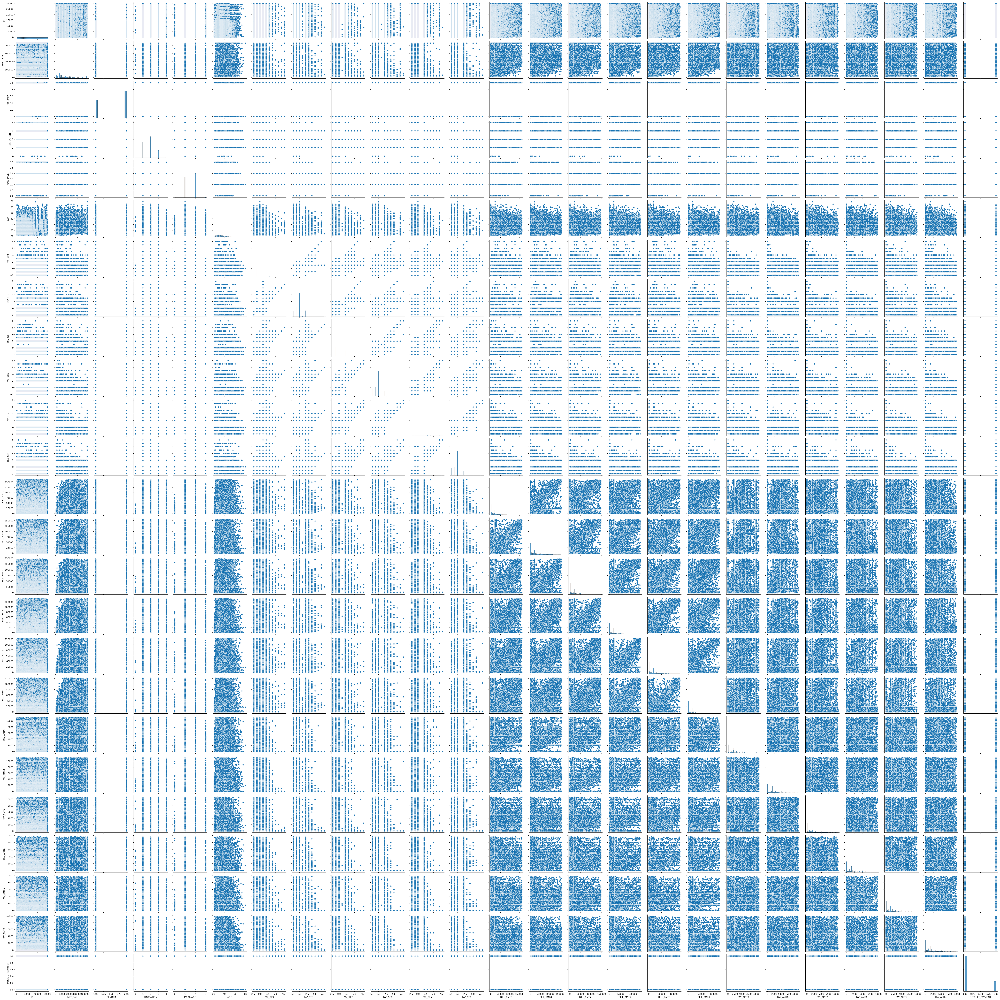

In [7]:
sns.pairplot(df)
plt.show()

In [8]:
X_xg = df.drop(['DEFAULT_PAYMENT'], axis=1)
Y_xg = df['DEFAULT_PAYMENT']

In [9]:
X_train, X_test, Y_train, Y_test = train_test_split(X_xg, Y_xg, test_size=0.2, random_state=42)

In [10]:
# SMOTE (only train data!!!)
smote = SMOTE(sampling_strategy='minority', random_state=42)
X_train_resampled, Y_train_resampled = smote.fit_resample(X_train, Y_train)


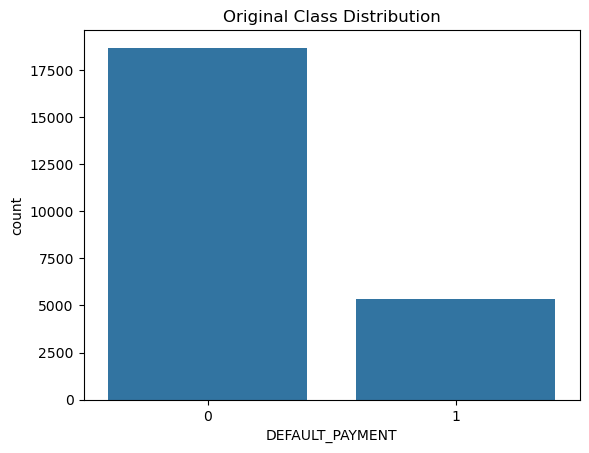

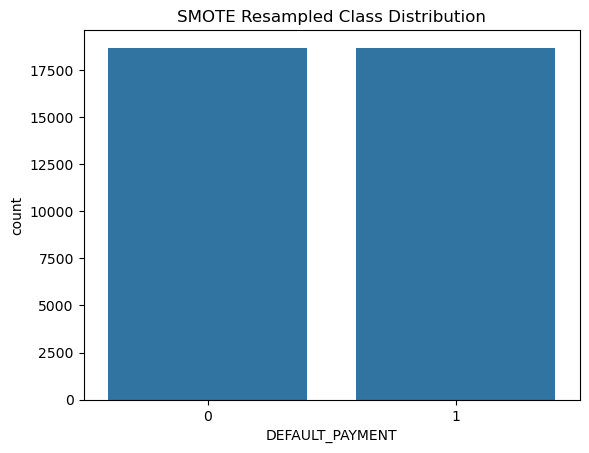

In [11]:
# before SMOTE
sns.countplot(x=Y_train)
plt.title("Original Class Distribution")
plt.show()

# after SMOTE 
sns.countplot(x=Y_train_resampled)
plt.title("SMOTE Resampled Class Distribution")
plt.show()

In [12]:
standard_scaler = StandardScaler()
x_train_xg = pd.DataFrame(standard_scaler.fit_transform(X_train), columns=X_train.columns)
x_test_xg  = pd.DataFrame(standard_scaler.fit_transform(X_test), columns=X_test.columns)

# SMOTE
X_train_scaled = standard_scaler.fit_transform(X_train_resampled)
X_test_scaled = standard_scaler.transform(X_test)

In [27]:
from xgboost import XGBClassifier

# calculation of classes (sample of class 0 : sample of class 1 ratio) 
scale_pos_weight = len(Y_train[Y_train == 0]) / len(Y_train[Y_train == 1])

In [14]:
# XGBoost model with SMOTE
model_xg_sm = xgb.XGBClassifier(
    max_depth=4,
    learning_rate=0.1,
    n_estimators=300,
    gamma=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='auc',
    random_state=42
)
model_xg_sm.fit(X_train_scaled, Y_train_resampled)

# perform predictions
Y_xgb_pred_sm = model_xg_sm.predict(X_test_scaled)  
Y_xgb_proba_sm = model_xg_sm.predict_proba(X_test_scaled)[:, 1]

In [28]:
# XGBoost model + scale_pos_weight
model_xg = xgb.XGBClassifier(
    scale_pos_weight=scale_pos_weight,  # without SMOTE, controll unbalanced 
    max_depth=4,
    learning_rate=0.1,
    gamma=0.1,
    n_estimators=300,
    subsample=0.8,
    colsample_bytree=0.8,
    eval_metric='auc',
    random_state=42
)
model_xg.fit(x_train_xg, Y_train)

# perform predictions
Y_xgb_pred = model_xg.predict(x_test_xg)  
Y_xgb_proba = model_xg.predict_proba(x_test_xg)[:, 1]  # for positive

In [29]:
print(f'Accuracy score of XGBoost Classifier: {accuracy_score(Y_test, Y_xgb_pred)}')
print(classification_report(Y_test, Y_xgb_pred))

Accuracy score of XGBoost Classifier: 0.7971666666666667
              precision    recall  f1-score   support

           0       0.85      0.90      0.87      4687
           1       0.55      0.44      0.49      1313

    accuracy                           0.80      6000
   macro avg       0.70      0.67      0.68      6000
weighted avg       0.78      0.80      0.79      6000



In [18]:
train_acc = model_xg_sm.score(X_train_scaled, Y_train_resampled)
test_acc = model_xg_sm.score(X_test_scaled, Y_test)
print("After SMOTE")
print(f"Train Accuracy: {train_acc:.2f}, Test Accuracy: {test_acc:.2f}")
print(classification_report(Y_test, Y_xgb_pred_sm))

After SMOTE
Train Accuracy: 0.85, Test Accuracy: 0.77
              precision    recall  f1-score   support

           0       0.86      0.85      0.85      4687
           1       0.48      0.49      0.49      1313

    accuracy                           0.77      6000
   macro avg       0.67      0.67      0.67      6000
weighted avg       0.77      0.77      0.77      6000



In [19]:
# wider tunning
param_grid = {
    'n_estimators': [50, 100, 200, 300, 500, 1000],  # 50~1000
    'max_depth': [2, 4, 6, 8, 10],  # 2~10
    'learning_rate': [0.001, 0.01, 0.05, 0.1, 0.2, 0.3],  # 0.001~0.3
    'subsample': [0.5, 0.7, 0.8, 0.9, 1.0],  # for overfitting
    'colsample_bytree': [0.5, 0.7, 0.8, 0.9, 1.0],  # feature sampleing ratio
    'gamma': [0, 0.1, 0.2, 0.5, 1], 
}

In [30]:
random_xg = RandomizedSearchCV(
    xgb.XGBClassifier(eval_metric='auc', random_state=42),  
    param_distributions=param_grid,
    n_iter=20,  # 20 combination test
    cv=5,  # 5-fold cross validation 
    scoring='accuracy',  
    n_jobs=-1,
    random_state=42
)
random_xg.fit(x_train_xg, Y_train)  
# find best parameters
print("Best Parameters:", random_xg.best_params_)

Best Parameters: {'subsample': 1.0, 'n_estimators': 50, 'max_depth': 4, 'learning_rate': 0.1, 'gamma': 0.2, 'colsample_bytree': 0.8}


In [31]:
best_model_rd_xg = random_xg.best_estimator_
Y_xgb_random_pred = best_model_rd_xg.predict(x_test_xg)
auc_xg = accuracy_score(Y_test, Y_xgb_random_pred)
print(f'Accuracy score of XGBoost Classifier with model random: {auc_xg}')

Accuracy score of XGBoost Classifier with model random: 0.8173333333333334


In [32]:
print("Classification Report:")
print(classification_report(Y_test, Y_xgb_random_pred))

Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.96      0.89      4687
           1       0.68      0.31      0.42      1313

    accuracy                           0.82      6000
   macro avg       0.76      0.63      0.66      6000
weighted avg       0.80      0.82      0.79      6000



In [33]:
param_grid_fine_tune = {
    'n_estimators': [40, 50, 60],  
    'max_depth': [3, 4, 5],  
    'learning_rate': [0.05, 0.1, 0.15],
    'gamma': [0.1, 0.2, 0.3],  
    'colsample_bytree': [0.7, 0.8, 0.9],  
    'subsample': [0.9, 1.0], 
}

In [34]:
xgb_model = xgb.XGBClassifier(eval_metric='auc', random_state=42)

# GridSearchCV
grid_xg = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid_fine_tune, 
    cv=3,  
    scoring='roc_auc',  
    n_jobs=-1
)

grid_xg.fit(x_train_xg, Y_train)

print("Best Parameters (Fine-Tuned):", grid_xg.best_params_)

Best Parameters (Fine-Tuned): {'colsample_bytree': 0.7, 'gamma': 0.2, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 50, 'subsample': 1.0}


In [35]:
best_xgb_model = grid_xg.best_estimator_
Y_pred = best_xgb_model.predict(x_test_xg)  

accuracy = accuracy_score(Y_test, Y_pred)
print(f"XGBoost model Accuracy: {accuracy:.3f}")

XGBoost model Accuracy: 0.816


In [36]:
Y_xgb_probs = best_model_rd_xg.predict_proba(x_test_xg)[:, 1]
fpr_xg, tpr_xg, _ = roc_curve(Y_test, Y_xgb_probs)
auc_rf = auc(fpr_xg, tpr_xg)

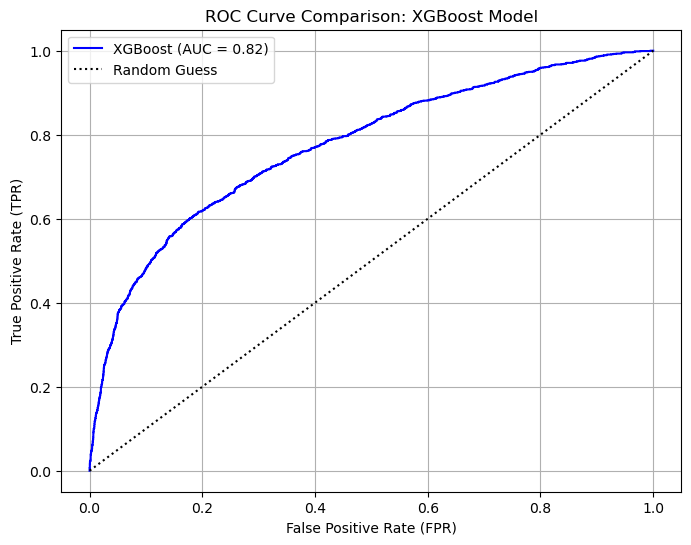

In [37]:
plt.figure(figsize=(8, 6))
plt.plot(fpr_xg, tpr_xg, color='blue', label=f'XGBoost (AUC = {auc_xg:.2f})')

# Random guess line
plt.plot([0, 1], [0, 1], color='black', linestyle='dotted', label='Random Guess')

# Labels and Title
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curve Comparison: XGBoost Model")
plt.grid(True)
plt.legend(loc='best') 
plt.show()